In [771]:
# %load one_step_regression.py
import xgboost as xgb
import pandas as pd
import numpy as np
from sklearn import preprocessing

from typing import Tuple

from simple_regression_forecasting import *


def keyvalue(df):
    """
    Transforms dataframe from the predictions in dataframe format (horizon x 45 i.e. one column of predictions per
    series) to the required format by Kaggle.
    :param df:
    :return:
    """
    df["horizon"] = range(1, df.shape[0] + 1)
    res = pd.melt(df, id_vars=["horizon"])
    res = res.rename(columns={"variable": "series"})
    res["Id"] = res.apply(lambda row: "s" + str(row["series"].split("-")[1]) + "h" + str(row["horizon"]), axis=1)
    res = res.drop(['series', 'horizon'], axis=1)
    res = res[["Id", "value"]]
    res = res.rename(columns={"value": "forecasts"})
    return res

def to_array(d: pd.DataFrame):
    ar = []
    for column in d.columns:
        v = d[column].values
        v = np.array(v)
        v = v.reshape((len(v),))
        ar.append(v)

    return np.array(ar)


def big_array_splitter(ar, steps_in, steps_out):
    # now to valuabel examples:
    in_out_length = steps_in + steps_out
    limit = len(ar[0]) - in_out_length

    # still big array with 45 columns
    X = []
    y = []
    for s in range(45):
        Xs = []
        Ys = []
        for d in range(limit):
            in_left = d
            in_right = d + steps_in
            out_left = d + steps_in
            out_right = d + steps_in + steps_out
            xs = ar[s][in_left: in_right].copy()
            ys = ar[s][out_left: out_right].copy()

            # xs = np.array(xs)
            # ys = np.array(ys)
            Xs.append(xs)
            Ys.append(ys)
        X.append(Xs)
        y.append(Ys)

    X = np.array(X)
    y = np.array(y)

    return (X, y)



def scale_by_serie(d, scaler):
    rd = d.copy()
    index = rd.index
    columns = rd.columns

    rn = {}
    for i in range(len(columns)):
        rn[i] = columns[i]

    scalers = []
    for i in range(len(columns)):
        s = scaler()
        s.fit(rd.iloc[:, i])
        rd.iloc[:, i] = pd.Series(s.transform(rd.iloc[:, i]))
        scalers.append(s)

    # rd = pd.DataFrame(rd, index=index)
    rd = rd.rename(columns=rn)

    return (rd, scalers)

def unscale_by_serie(d, scalers):
    rd = d.copy()
    index = rd.index
    columns = rd.columns

    rn = {}
    for i in range(len(columns)):
        rn[i] = columns[i]

    for i in range(len(columns)):
        s = scalers[i]
        rd.iloc[:, i] = s.inversetransform(rd.iloc[:, i])

    rd = pd.DataFrame(rd, index=index)
    rd = rd.rename(columns=rn)

    return rd


def scale(d, scaler):
    rd = d.copy()
    index = rd.index
    columns = rd.columns
    rn = {}
    for i in range(len(columns)):
        rn[i] = columns[i]

    scaler.fit(rd)
    rd = scaler.transform(rd)
    rd = pd.DataFrame(rd, index=index)
    rd = rd.rename(columns=rn)

    return (rd, scaler)


def unscale(d, scaler):
    rd = d.copy()
    index = rd.index
    columns = rd.columns
    rn = {}
    for i in range(len(columns)):
        rn[i] = columns[i]

    rd = scaler.inverse_transform(rd)
    rd = pd.DataFrame(rd, index=index)
    rd = rd.rename(columns=rn)

    return rd




def prepare(d: pd.DataFrame, steps_in=14, steps_out=21,
            outliers_remover=remove_outliers,
            scalers=[preprocessing.MinMaxScaler, preprocessing.StandardScaler],
            diff_periods=1, test_size=0.2):
    # create a new dataset
    rd = d.copy()

    # remove outliers
    rd = outliers_remover(rd)

    scaled = {}
    # for each scaler, a new dataset
    for scaler in scalers:
        (rd_scaled, rd_scaler) = scale(rd, scaler())
        scaled[scaler] = (rd_scaled, rd_scaler)

    # for each dataset, remove trending
    for scaler in scaled:
        (rd_scaled, rd_scaler) = scaled[scaler]

        rd_seed = rd_scaled.head(diff_periods).copy()

        rd_scaled = rd_scaled.diff(diff_periods)
        rd_scaled = rd_scaled.tail(len(rd_scaled.index) - diff_periods)

        scaled[scaler] = (rd_scaled, rd_scaler, rd_seed)

    # convert to train dataset
    for scaler in scaled:
        (rd_scaled, rd_scaler, rd_seed) = scaled[scaler]

        rd_df = rd_scaled.copy()

        (rd_days, rd_series) = tuple(rd_scaled.shape)

        rd_data = to_array(rd_scaled)
        (rd_X, rd_y) = big_array_splitter(rd_data, steps_in, steps_out)

        scaled[scaler] = [(rd_X, rd_y), rd_scaler, rd_seed, (rd_days, rd_series), rd_data, rd_df]

    # split into train and validation
    for scaler in scaled:
        [(rd_X, rd_y), rd_scaler, rd_seed, (rd_days, rd_series), rd_data, rd_df] = scaled[scaler]

        rd_datasets = split_to_test(rd_X, rd_y, rd_days, rd_series, steps_in, steps_out, test_size)

        scaled[scaler] = [(rd_X, rd_y), rd_scaler, rd_seed, (rd_days, rd_series), rd_data, rd_df, rd_datasets]

    # restructure the data
    for scaler in scaled:
        [(rd_X, rd_y), rd_scaler, rd_seed, (rd_days, rd_series), rd_data, rd_df, rd_datasets] = scaled[scaler]

        rd_dict = {}

        rd_dict['rd_X'] = rd_X
        rd_dict['rd_y'] = rd_y
        rd_dict['rd_scaler'] = rd_scaler
        rd_dict['rd_seed'] = rd_seed
        rd_dict['rd_days'] = rd_days
        rd_dict['rd_series'] = rd_series
        rd_dict['rd_datasets'] = rd_datasets
        rd_dict['rd_data'] = rd_data
        rd_dict['rd_df'] = rd_df

        scaled[scaler] = rd_dict

    # return the big struct
    return scaled


def demerge_dataset(ds, steps_out):
    [X_train, X_val, y_train, y_val] = ds
    demerged_datasets = []

    for i in range(steps_out):
        train, val = y_train[:, i].copy(), y_val[:, i].copy()

        demerged_datasets.append([X_train, X_val, train, val])

    demerged_datasets = np.array(demerged_datasets)
    return demerged_datasets


def train_for_one_step(d, model, steps_out, params={}):
    demerged_datasets = demerge_dataset(d, steps_out)

    models = []

    for i in range(steps_out):
        m = model(**params)

        [X_train, X_val, t_train, t_val] = demerged_datasets[i]

        m.fit(X_train, t_train)

        models.append(m)

    return models

def train_for_one_step_all_series(dataset, model, steps_out, params={}):
    models_by_series = []

    for i in range(len(dataset)):
        models = train_for_one_step(dataset[i], model, steps_out, params)
        models_by_series.append(models)

    return models_by_series


def predict_custom_out(data, models, steps_out):
    d = data.copy()
    preds = []

    for i in range(steps_out):
        m = models[i]

        t_preds = m.predict(d)

        preds.append(t_preds)

    preds = np.array(preds)
    preds = np.transpose(preds)

    return preds

def predict_custom_out_all_series(datas, models_by_series, steps_out):
    preds = []

    for i in range(len(datas)):
        p = predict_custom_out(datas[i], models_by_series[i], steps_out)

        preds.append(p)

    preds = np.array(preds)
    return preds

def custom_smape(predt: np.ndarray, dtrain: xgb.DMatrix) -> Tuple[str, float]:
    ''' Root mean squared log error metric.'''
    y = dtrain.get_label()
    predt[predt < -1] = -1 + 1e-6
    elements = np.power(np.log1p(y) - np.log1p(predt), 2)
    return 'PySMAPE', smape_loss(predt, y)



def split_to_test(X, y, days, series, steps_in, steps_out, test_size):
        regression_length = days - (steps_in + steps_out)
        train_size = int(regression_length * (1 - test_size))
        tail_size = regression_length - train_size

        datasets = []

        # do for all series
        for s in range(series):
            t = [X[s][:train_size], X[s][train_size:], y[s][:train_size], y[s][train_size:]]
            datasets.append(t)

        datasets = np.array(datasets)

        return datasets


def compute_score(real_df, pred, steps_out, loss_function):
    (days, series) = tuple(real_df.shape)

    scores = np.zeros((series,))

    y_validation_array = to_array(real_df.tail(steps_out))
    pred_array = to_array(pred)

    for i in range(series):
        scores[i] = loss_function(y_validation_array[i, :], pred_array[i, :])

    return scores

In [772]:
# read the csv data
df = pd.read_csv('../../train.csv', parse_dates = ['Day'], index_col='Day')

df = remove_outliers(df)

dfc = df.copy(deep=True)

/home/horacio/Langs/python/src/HandsOnIA/defis3/clement_git/time_series/simple_regression_forecasting.py:80: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  serie[zoutlier] = np.nan


In [773]:
(dfc, scaler) = scale(dfc, preprocessing.MinMaxScaler())

In [806]:
(days, series) = tuple(df.shape)
steps_in = 20
steps_out = 21
test_size = 0.01

In [807]:
data = to_array(dfc)
(X, y) = big_array_splitter(data, steps_in, steps_out)

In [808]:
print(len(X[0]), len(y[0]))

741 741


In [809]:
# take as argument the past year data
# I need to modify the data
length_X = len(X[0])

print(X.shape, y.shape)

new_X = np.zeros((series, length_X-365, steps_in*2))

for s in range(series):
    for i in range(len(new_X[0])):
        new_X[s][i] = np.concatenate([X[s][i], X[s][i+365]])
        

new_y = np.zeros((series, length_X-365, steps_out))

for s in range(series):
    for i in range(len(new_X[0])):
        new_y[s][i] = y[s][i+365]    
        
print(new_X.shape, new_y.shape)

(45, 741, 20) (45, 741, 21)
(45, 376, 40) (45, 376, 21)


In [810]:
# datasets = split_to_test(X, y, days, series, steps_in, steps_out, test_size)
datasets = split_to_test(new_X, new_y, days, series, steps_in, steps_out, test_size)

In [811]:
import sklearn
import sklearn.kernel_ridge


params = {'max_depth':10, 'booster':'dart', 'eta':0.1, 'subsample':0.4}
# models = train_for_one_step(datasets[0], xgb.XGBRegressor, steps_out)

In [812]:
# train for all series
models_constructors = [xgb.XGBRegressor, sklearn.linear_model.Ridge, sklearn.kernel_ridge.KernelRidge]
models_by_series_list = []

for model in models_constructors:

    models_by_series = train_for_one_step_all_series(datasets, model, steps_out)
    models_by_series_list.append(models_by_series)

[22:12:33] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[22:12:33] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[22:12:33] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[22:12:34] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[22:12:34] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[22:12:34] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[22:12:34] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[22:12:34] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of re

[22:12:39] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[22:12:39] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[22:12:39] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[22:12:39] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[22:12:39] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[22:12:39] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[22:12:39] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[22:12:39] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of re

[22:12:45] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[22:12:45] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[22:12:45] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[22:12:45] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[22:12:45] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[22:12:45] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[22:12:45] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[22:12:45] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of re

[22:12:50] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[22:12:50] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[22:12:50] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[22:12:50] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[22:12:50] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[22:12:51] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[22:12:51] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[22:12:51] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of re

[22:12:56] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[22:12:56] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[22:12:56] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[22:12:56] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[22:12:56] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[22:12:56] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[22:12:56] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[22:12:56] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of re

[22:13:01] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[22:13:01] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[22:13:01] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[22:13:01] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[22:13:01] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[22:13:01] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[22:13:01] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[22:13:01] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of re

[22:13:06] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[22:13:06] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[22:13:06] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[22:13:06] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[22:13:07] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[22:13:07] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[22:13:07] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[22:13:07] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of re

[22:13:11] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[22:13:12] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[22:13:12] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[22:13:12] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[22:13:12] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[22:13:12] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[22:13:12] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[22:13:12] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of re

[22:13:17] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[22:13:17] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[22:13:17] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[22:13:17] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[22:13:17] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[22:13:17] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[22:13:17] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[22:13:17] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of re

[22:13:22] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[22:13:22] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[22:13:22] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[22:13:22] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[22:13:22] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[22:13:23] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[22:13:23] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[22:13:23] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of re

[22:13:28] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[22:13:28] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[22:13:28] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[22:13:28] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[22:13:28] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[22:13:28] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[22:13:28] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[22:13:28] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of re

[22:13:33] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[22:13:33] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[22:13:33] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[22:13:33] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[22:13:34] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[22:13:34] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[22:13:34] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[22:13:34] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of re

[22:13:39] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[22:13:39] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[22:13:39] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[22:13:39] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[22:13:39] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[22:13:39] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[22:13:39] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[22:13:39] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of re

[22:13:45] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[22:13:45] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[22:13:45] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[22:13:45] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[22:13:45] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[22:13:45] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[22:13:45] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[22:13:45] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of re

[22:13:50] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[22:13:50] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[22:13:50] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[22:13:51] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[22:13:51] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[22:13:51] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[22:13:51] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[22:13:51] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of re

In [817]:
X1_validation_dataframe = dfc.copy().iloc[-steps_in -steps_out: -steps_out]
# take last year too
X0_validation_dataframe = dfc.copy().iloc[-steps_in -steps_out -365: -steps_out -365]

y_validation_dataframe = dfc.tail(steps_out).copy()

In [818]:
print(X0_validation_dataframe.index.min())
print(X0_validation_dataframe.index.max())
print(X1_validation_dataframe.index.min())
print(X1_validation_dataframe.index.max())
print(y_validation_dataframe.index.min())
print(y_validation_dataframe.index.max())

2016-07-11 00:00:00
2016-07-30 00:00:00
2017-07-11 00:00:00
2017-07-30 00:00:00
2017-07-31 00:00:00
2017-08-20 00:00:00


In [821]:
X0_validation = to_array(X0_validation_dataframe)
X1_validation = to_array(X1_validation_dataframe)
print(X0_validation.shape)

(45, 20)


In [822]:
X_validation = np.zeros((series,steps_in*2))
for s in range(series):
    X_validation[s] = np.concatenate([X0_validation[s], X1_validation[s]])
    
print(X_validation.shape)

(45, 40)


In [823]:
X_validation = np.array([x.reshape((1,-1)) for x in X_validation])
print(X_validation.shape)

(45, 1, 40)


In [824]:
futures = []
for models_by_series in models_by_series_list:

    X_validation_preds = predict_custom_out_all_series(X_validation, models_by_series, steps_out)
    X_validation_preds = X_validation_preds.reshape((series,steps_out))
    X_validation_preds = np.transpose(X_validation_preds)
    
    # print(X_validation_preds[:,44])
    
    future = pd.DataFrame(X_validation_preds, index=y_validation_dataframe.index)
    future = future.rename(columns=create_rename_dic())
    future_unscaled = unscale(future, scaler)
    futures.append(future_unscaled)

In [825]:
number_of_models = len(models_constructors)
scores = np.zeros((number_of_models, series))
number_of_futures = len(futures)

for i in range(number_of_futures):
    scores[i] = compute_score(df.copy(), futures[i], steps_out, smape_loss)

print(scores.shape)

(3, 45)


In [833]:
w_vali = weighted_prediction(scores, futures)
w_score = compute_score(df.copy(), w_vali, steps_out, smape_loss)

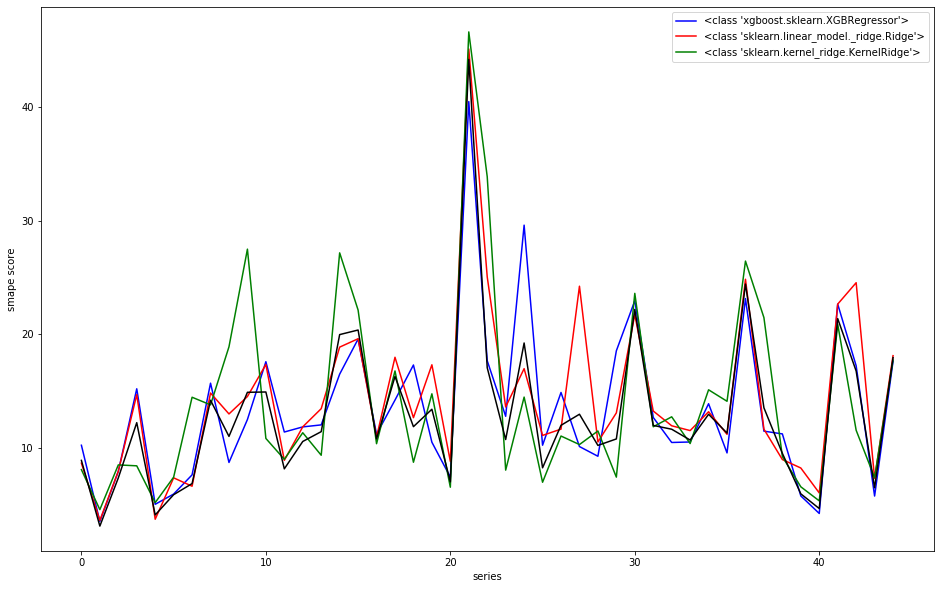

In [840]:
plt.figure(figsize=(16,10))
colors = ['blue', 'red', 'green', 'cyan', 'magenta']

for i in range(len(scores)):
    plt.plot(scores[i], color=colors[i%(len(scores))])
plt.plot(w_score, color='black')
plt.legend([str(me) for me in models_constructors])
plt.xlabel('series')
plt.ylabel('smape score')

plt.savefig('plot_pdf/smape_score.pdf')

plt.show()

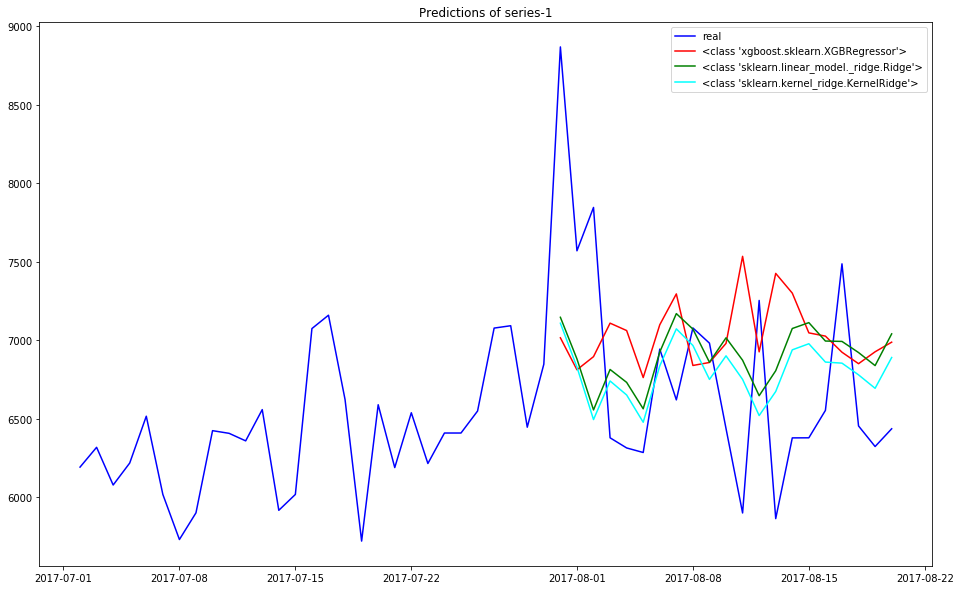

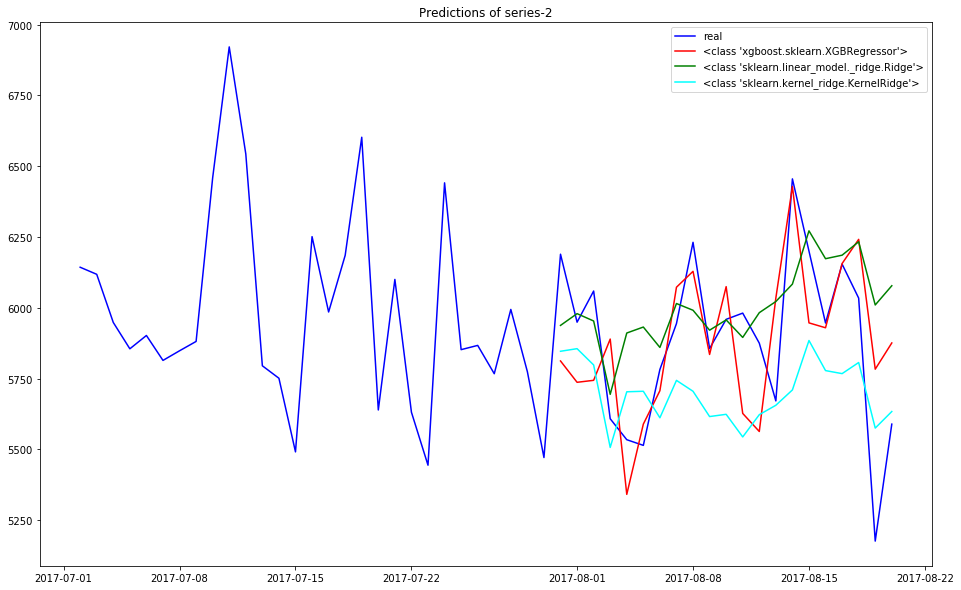

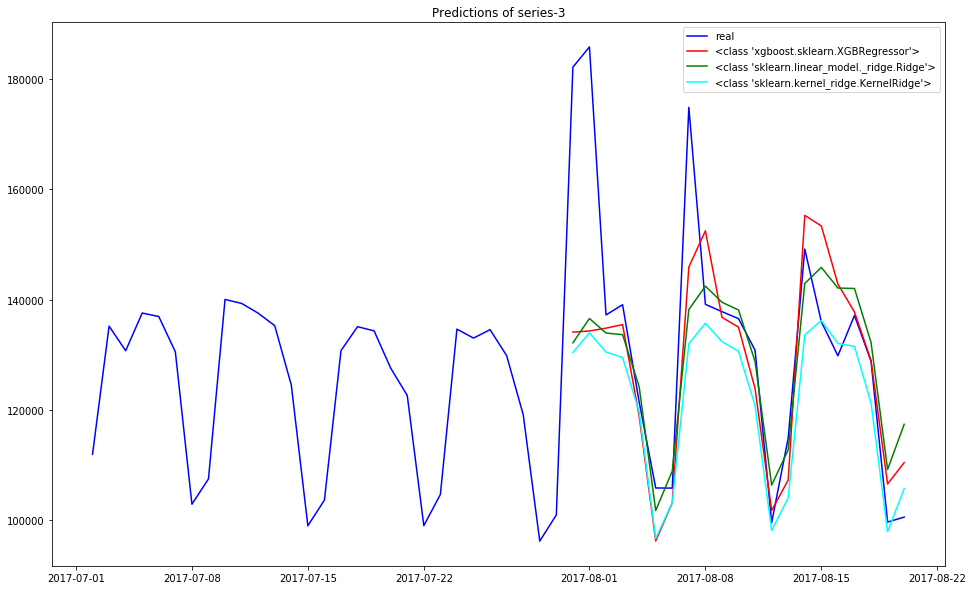

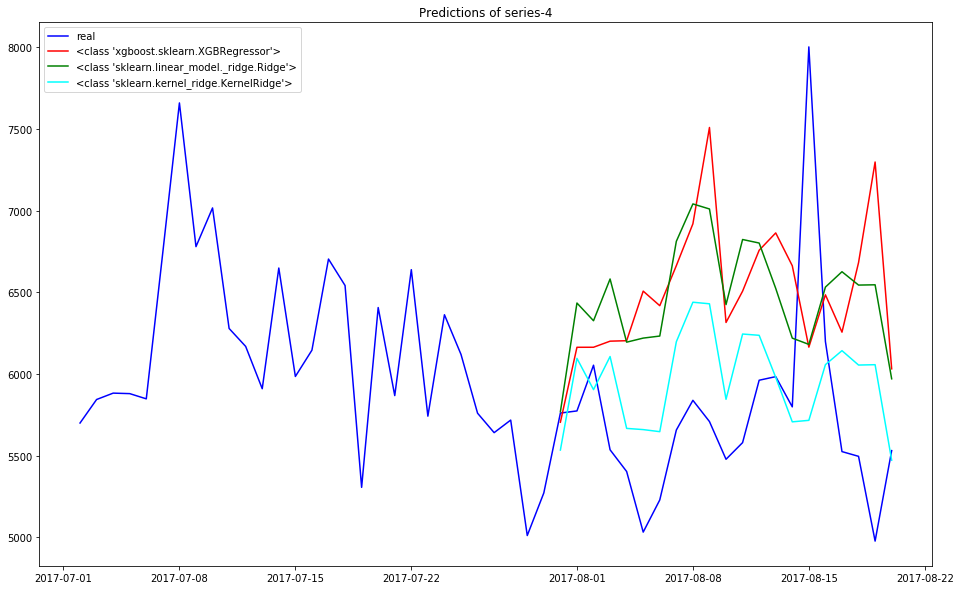

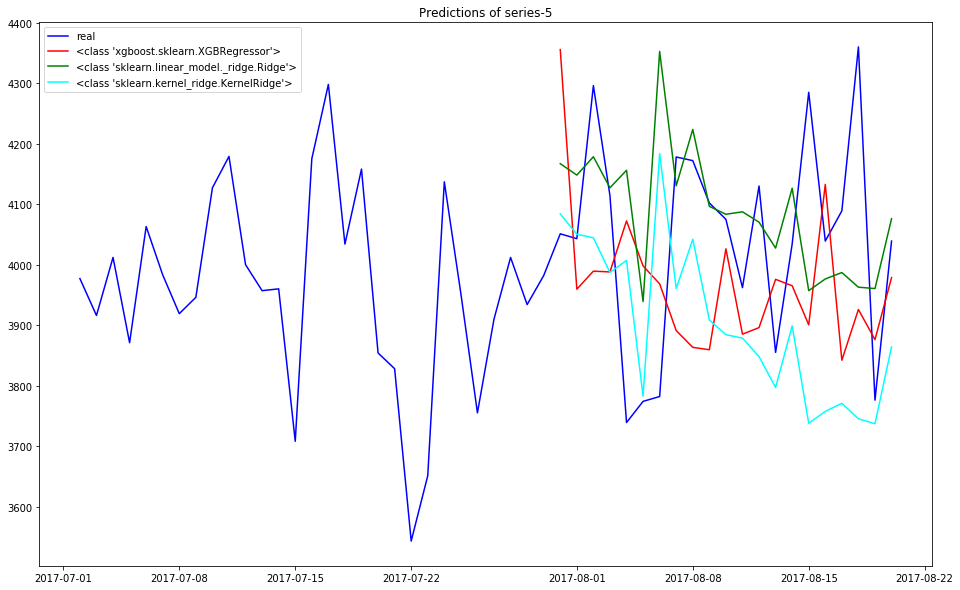

...

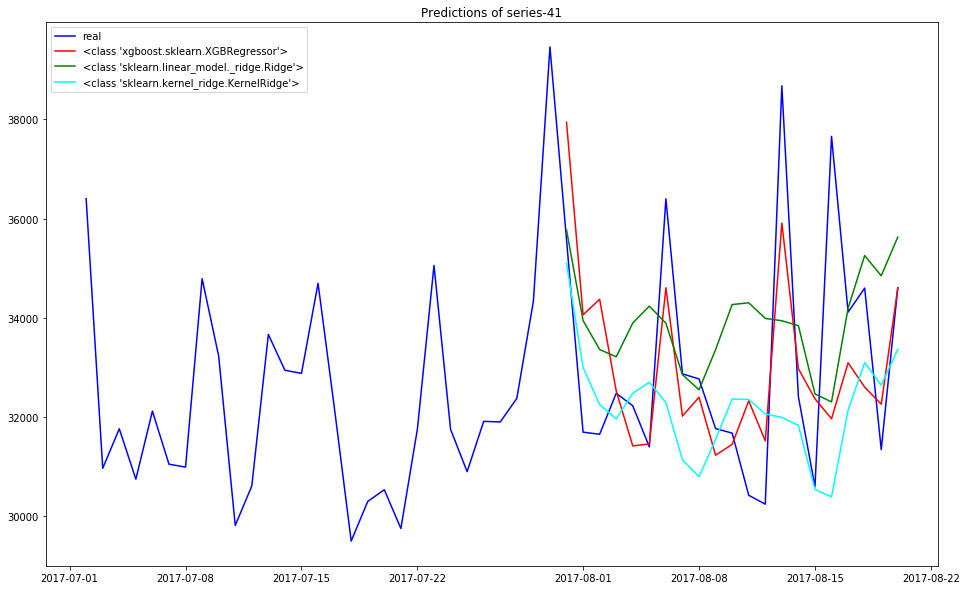

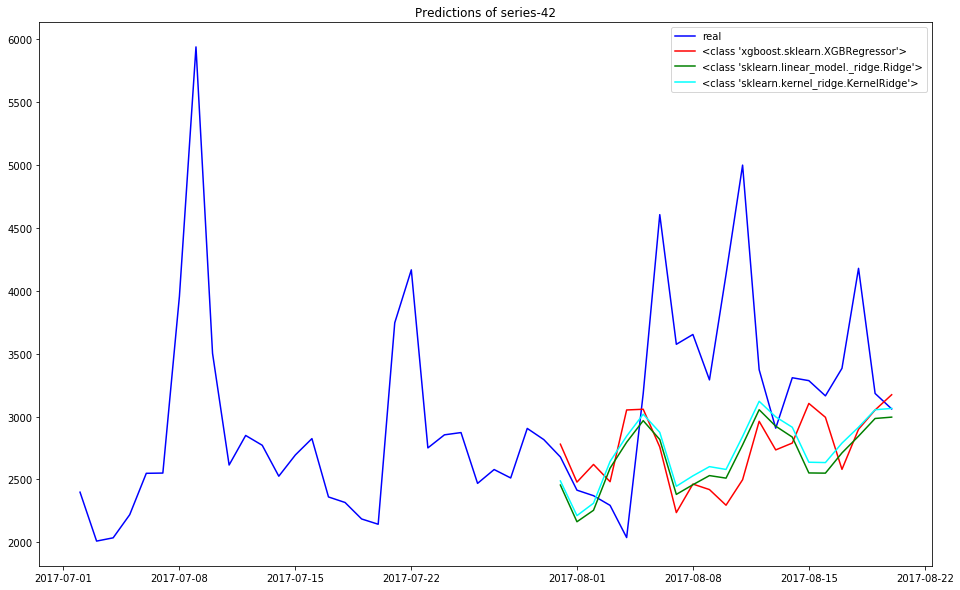

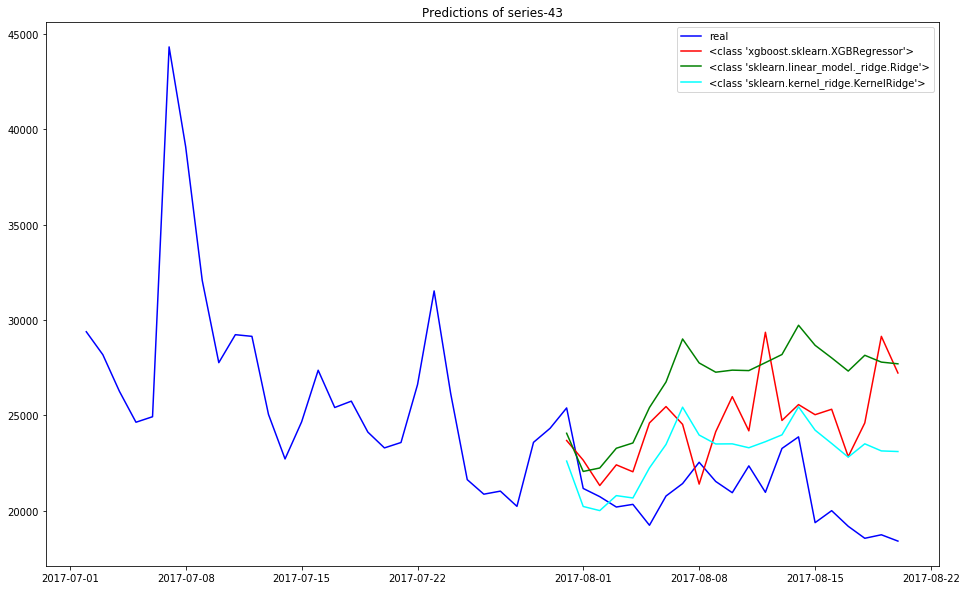

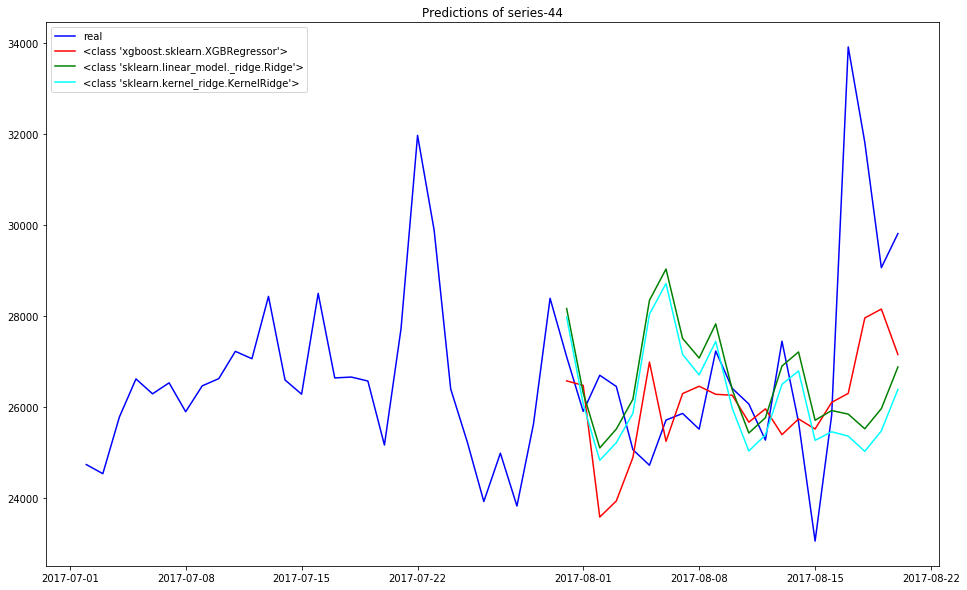

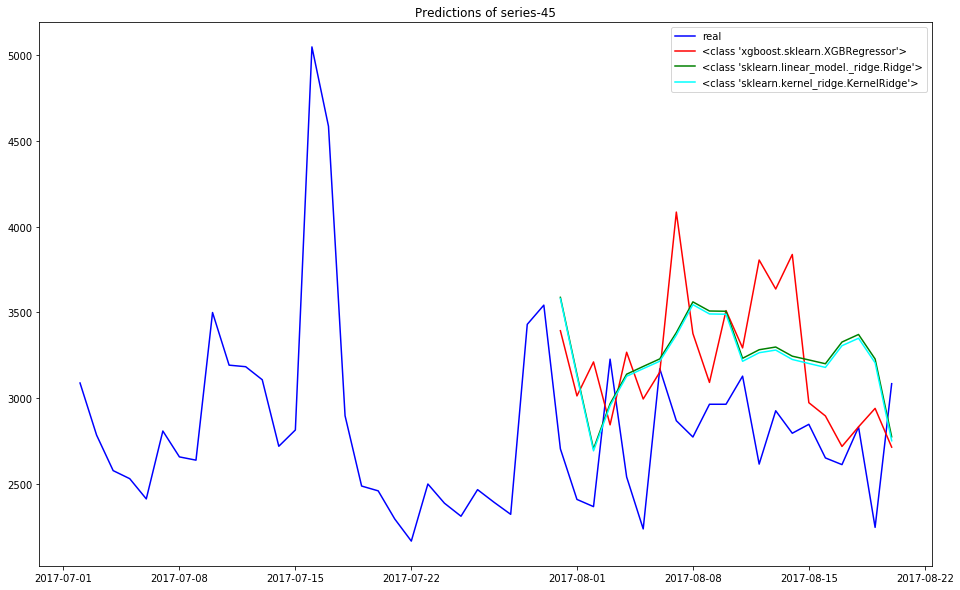

In [841]:
colors = ['red', 'green', 'cyan', 'magenta', 'yellow', 'brown']
futures_length = len(futures)

for column in future.columns:
    plt.figure(figsize=(16,10))
    plt.plot(df.tail(50)[column], color='blue')
    for i in range(futures_length):
        plt.plot(futures[i][column], color=colors[i])
        
    legend = ['real']
    legend.extend([str(m) for m in models_constructors])
    plt.legend(legend)
    plt.title('Predictions of ' + str(column))
    
    plt.savefig('plot_pdf/validation_of_'+(str(column))+'.pdf')
    
    plt.show()

In [836]:
X0_future = dfc.tail(steps_in+365).head(steps_in).copy()
X1_future =  dfc.tail(steps_in).copy()

X0_future = to_array(X0_future)
X1_future = to_array(X1_future)

X_future = np.zeros((series,steps_in*2))
for s in range(45):
    X_future[s] = np.concatenate([X0_future[s], X1_future[s]])

X_future = np.array([x.reshape((1,-1)) for x in X_future])

preds_futures = []
for models_by_series in models_by_series_list:

    preds_future = predict_custom_out_all_series(X_future, models_by_series, steps_out)

    preds_future = preds_future.reshape((series,steps_out))
    preds_future = np.transpose(preds_future)
    
    # print(preds_future[:,44])
    
    preds_future = pd.DataFrame(preds_future, index=create_next_index(dfc, steps_out))
    preds_future = preds_future.rename(columns=create_rename_dic())

    preds_future = unscale(preds_future, scaler)
    
    preds_futures.append(preds_future)

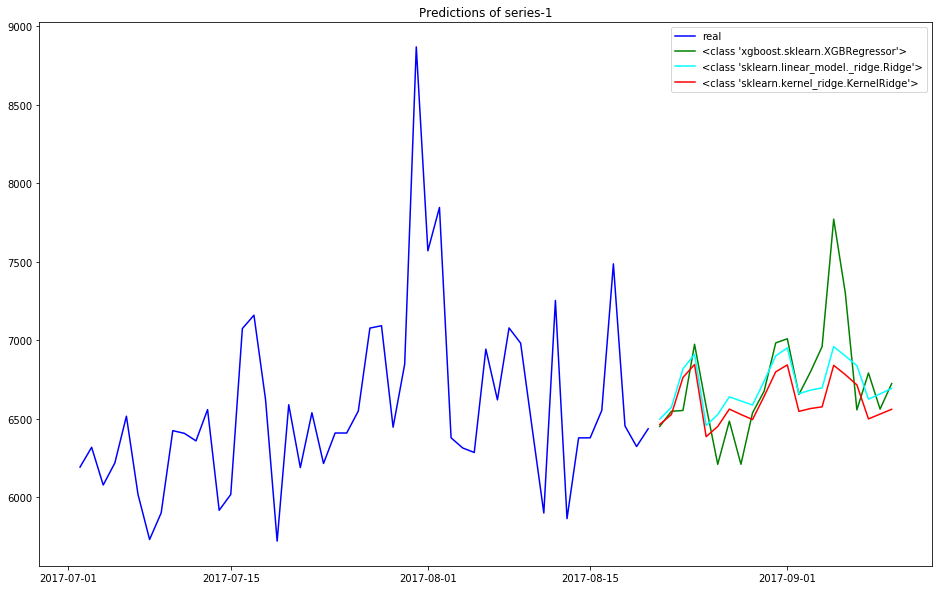

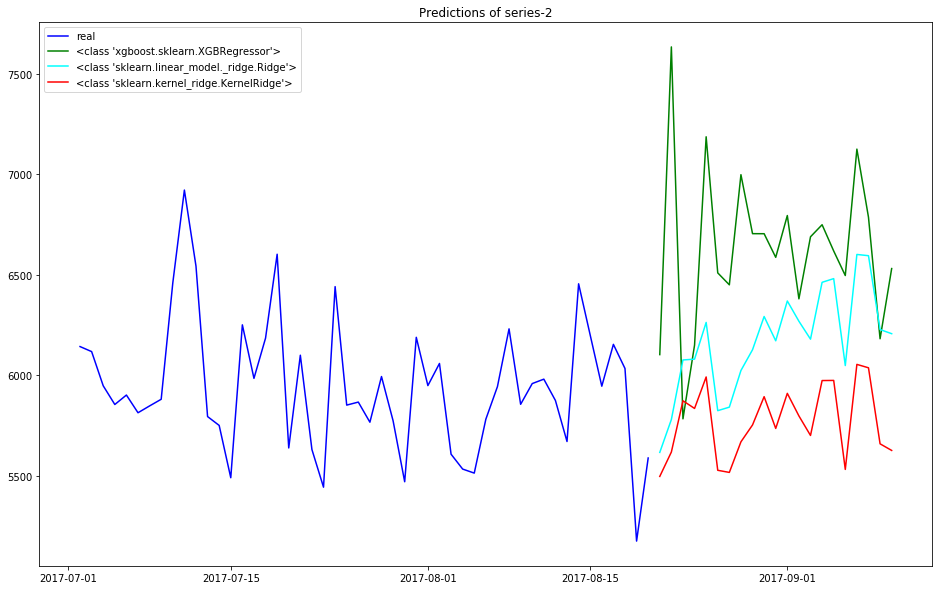

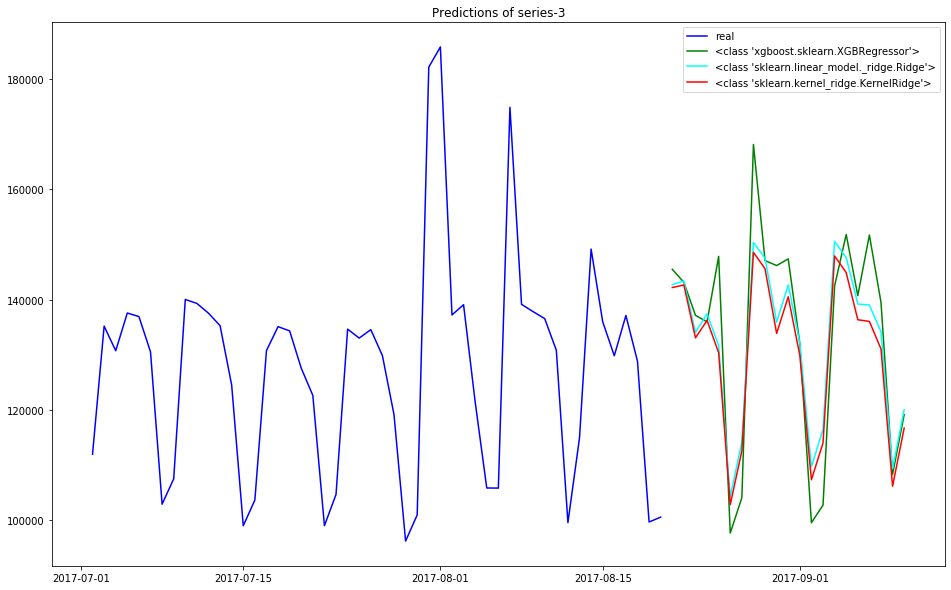

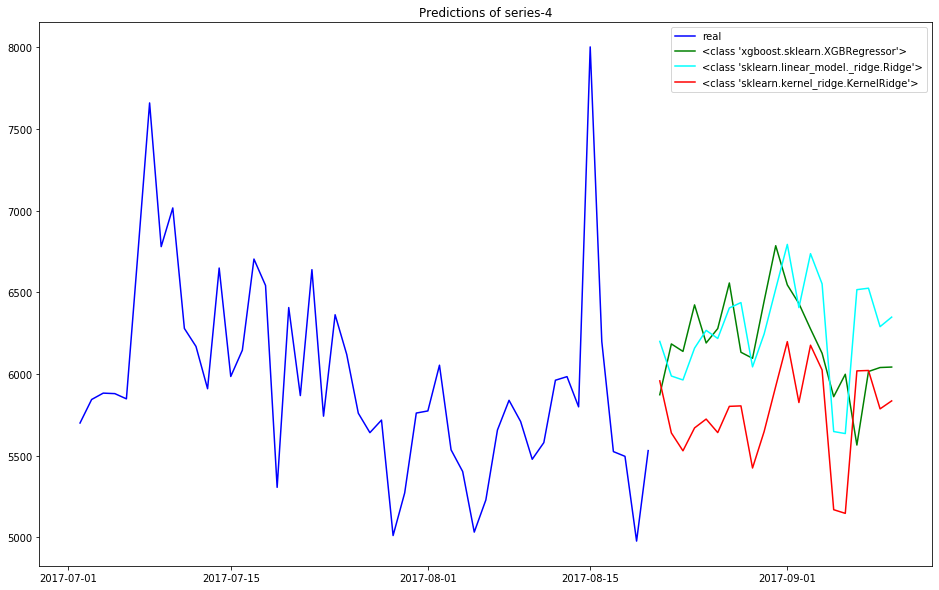

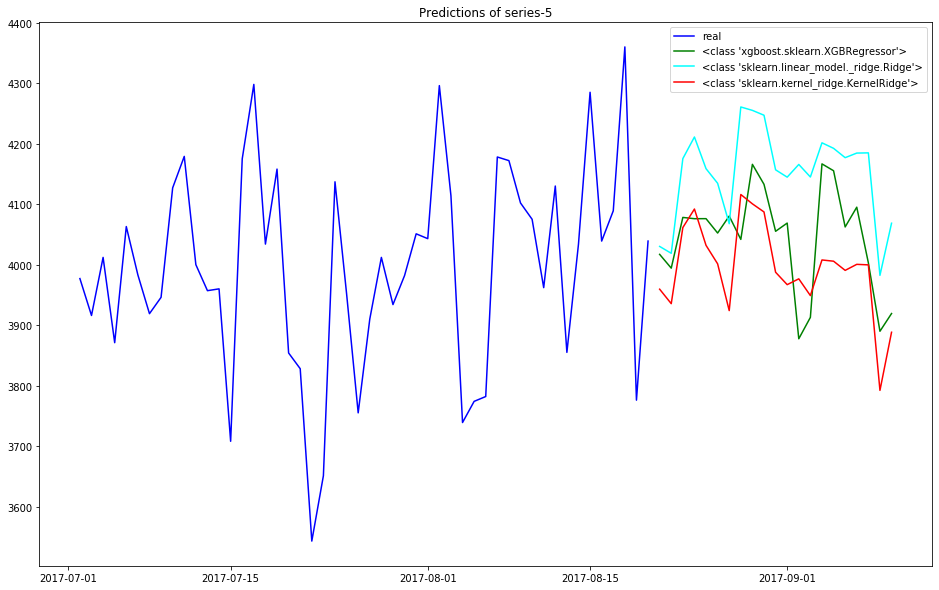

...

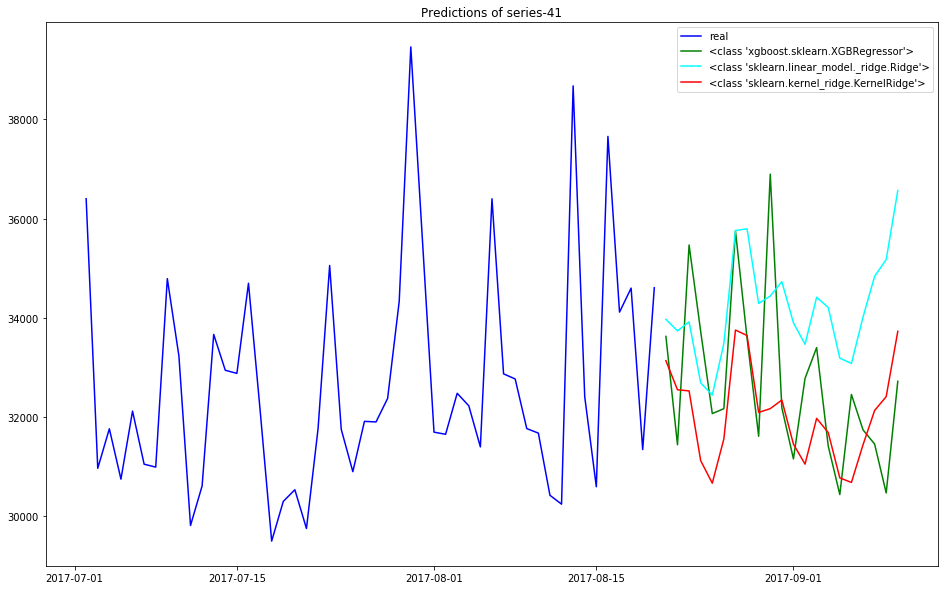

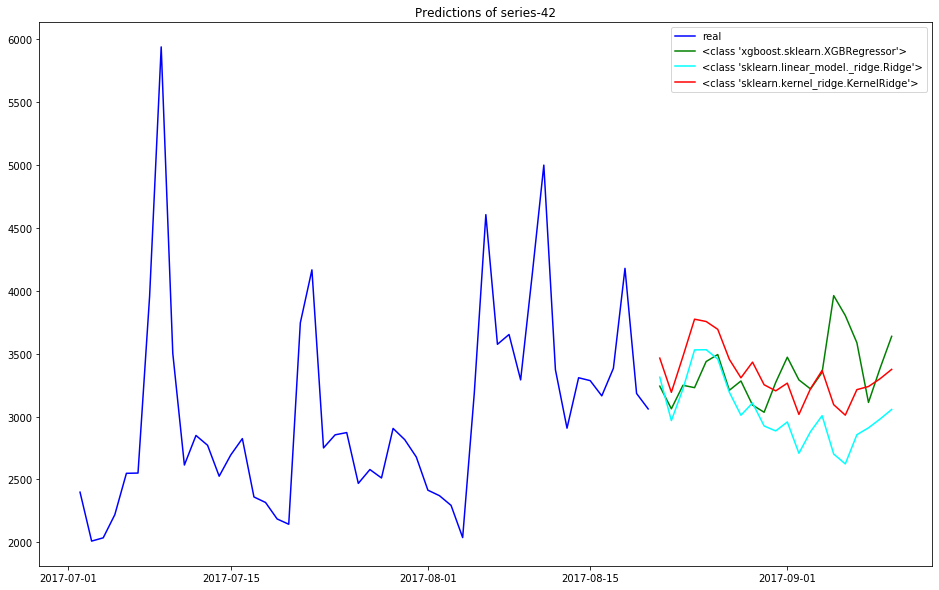

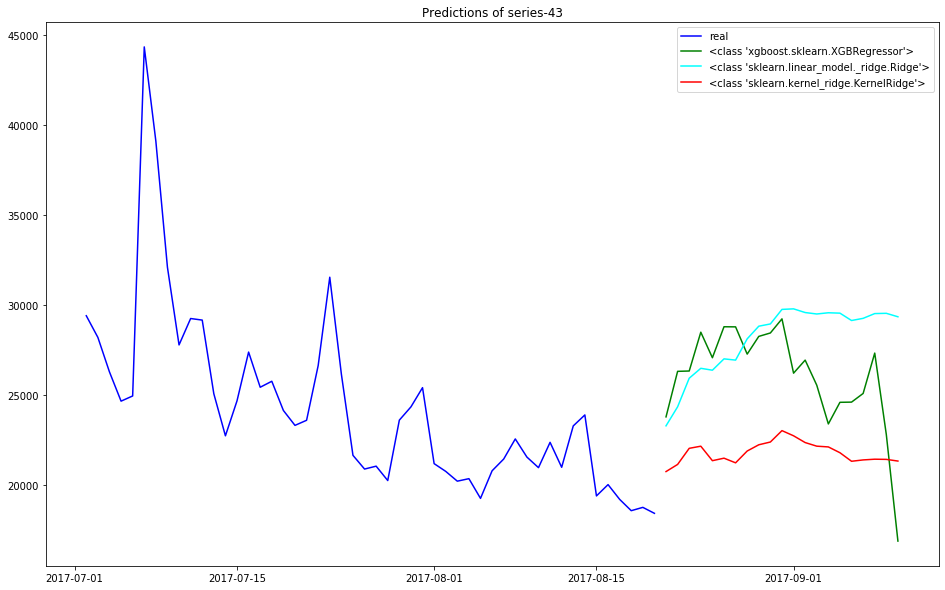

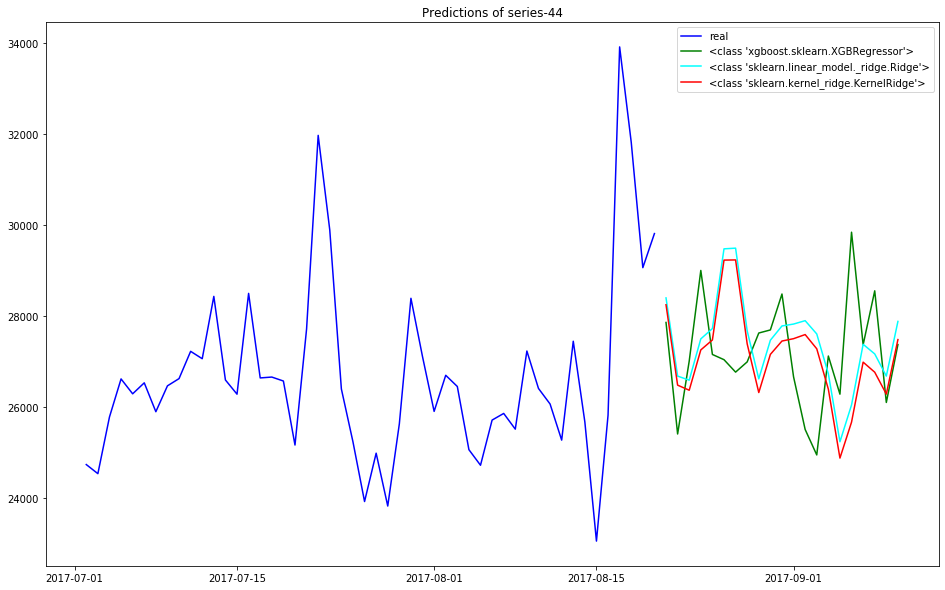

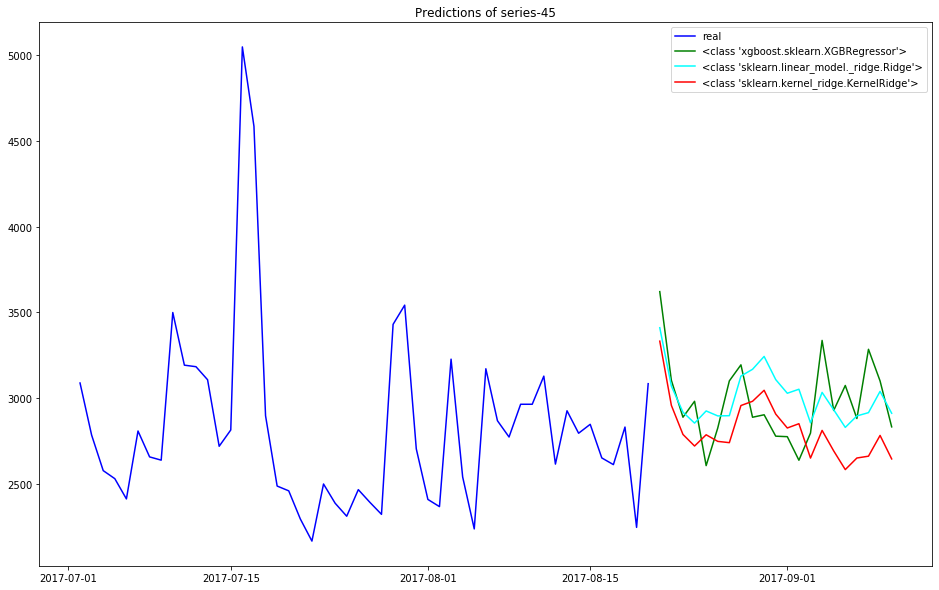

In [837]:
colors = ['red', 'green', 'cyan', 'magenta', 'yellow', 'brown']
preds_futures_length = len(preds_futures)


for column in future.columns:
    plt.figure(figsize=(16,10))
    plt.plot(df.tail(50)[column], color='blue')
    # plt.plot(future_unscaled[column], color='red')
    for i in range(preds_futures_length):
        plt.plot(preds_futures[i][column], color=colors[(i+1)%preds_futures_length])
        
    legend = ['real']
    legend.extend([str(m) for m in models_constructors])
    plt.legend(legend)
    plt.title('Predictions of ' + str(column))
    plt.show()

In [838]:
from tools import weighted_prediction

wp = weighted_prediction(scores, preds_futures)

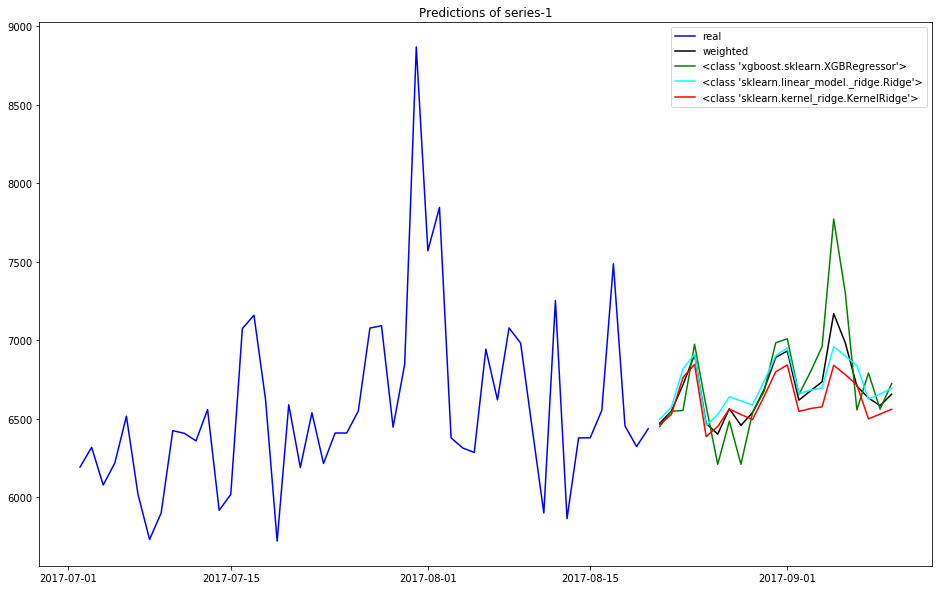

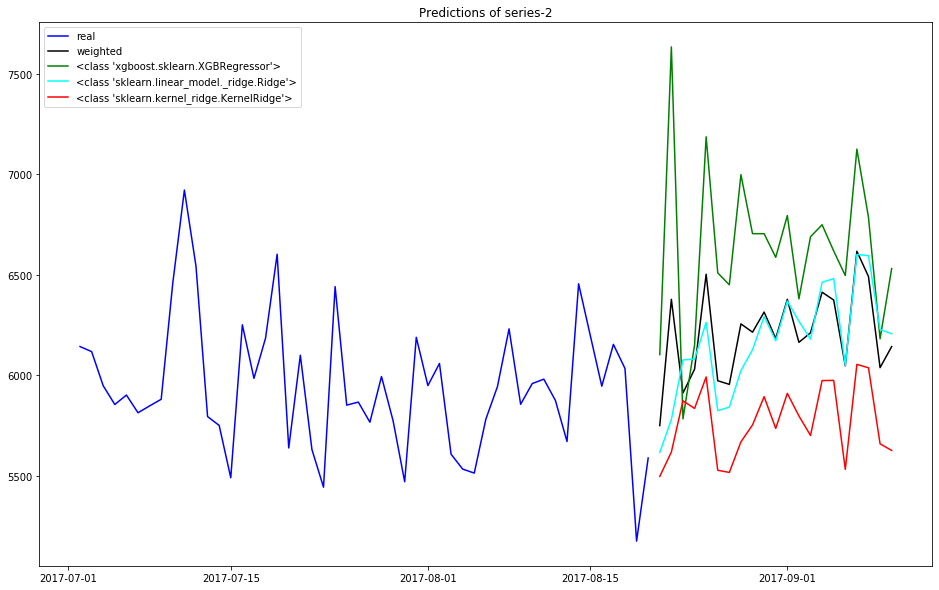

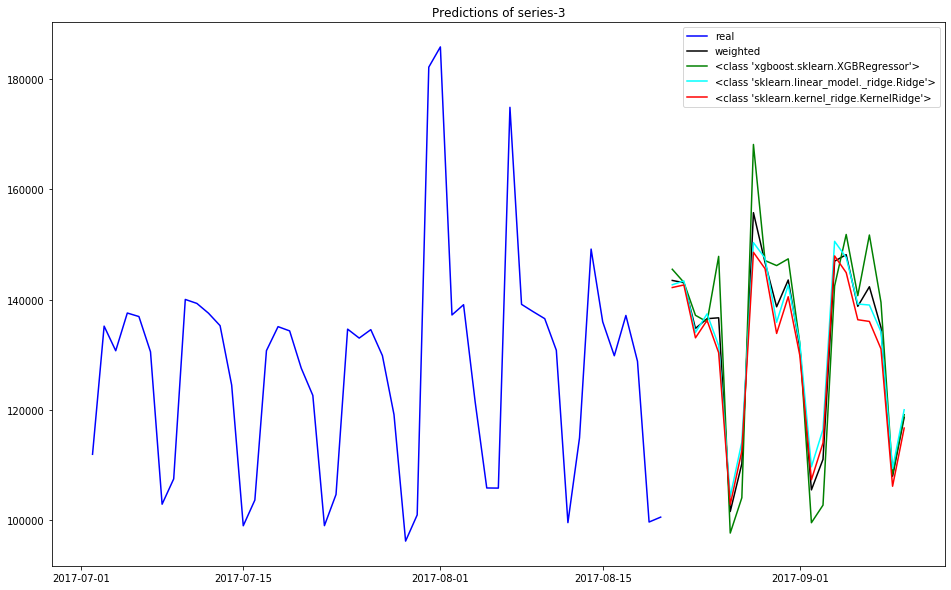

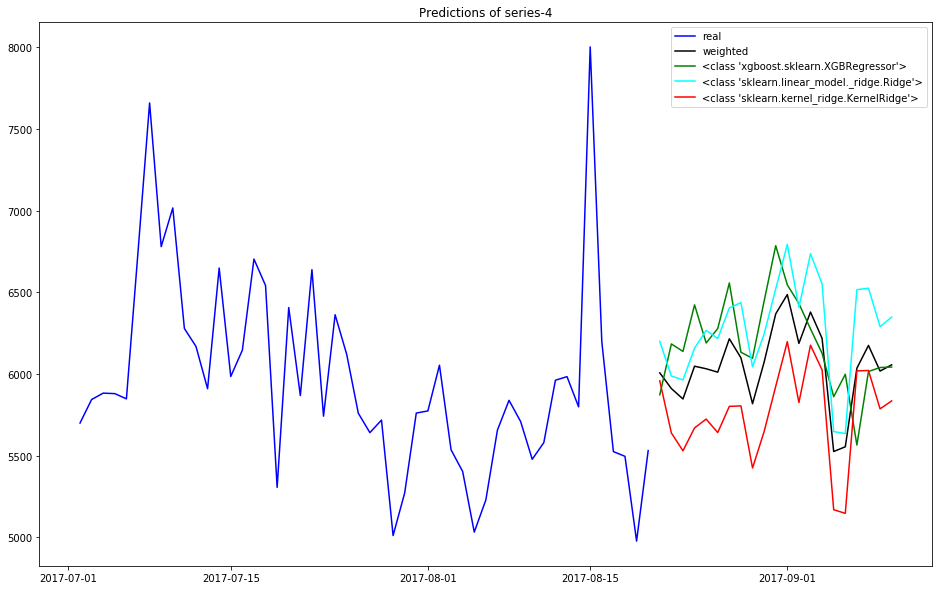

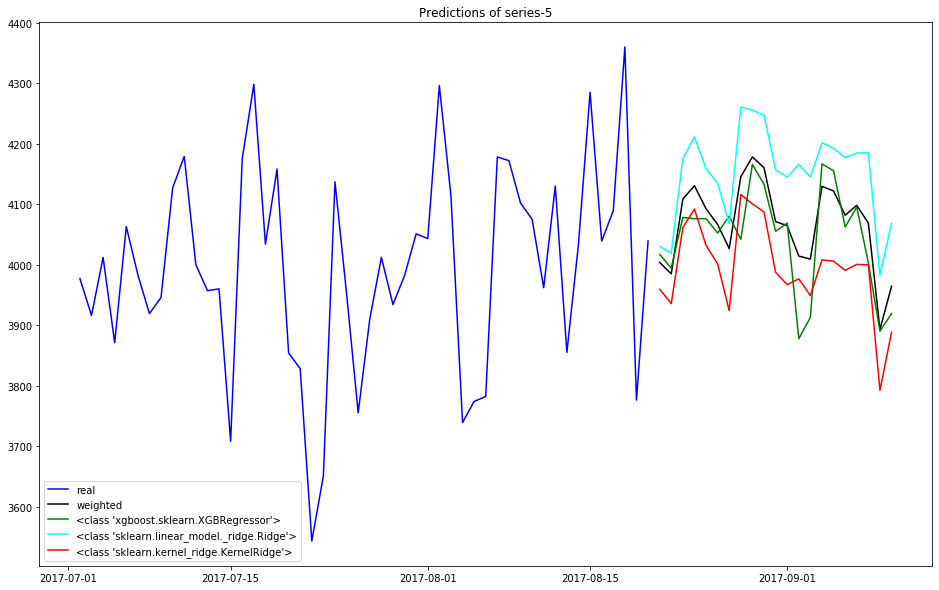

...

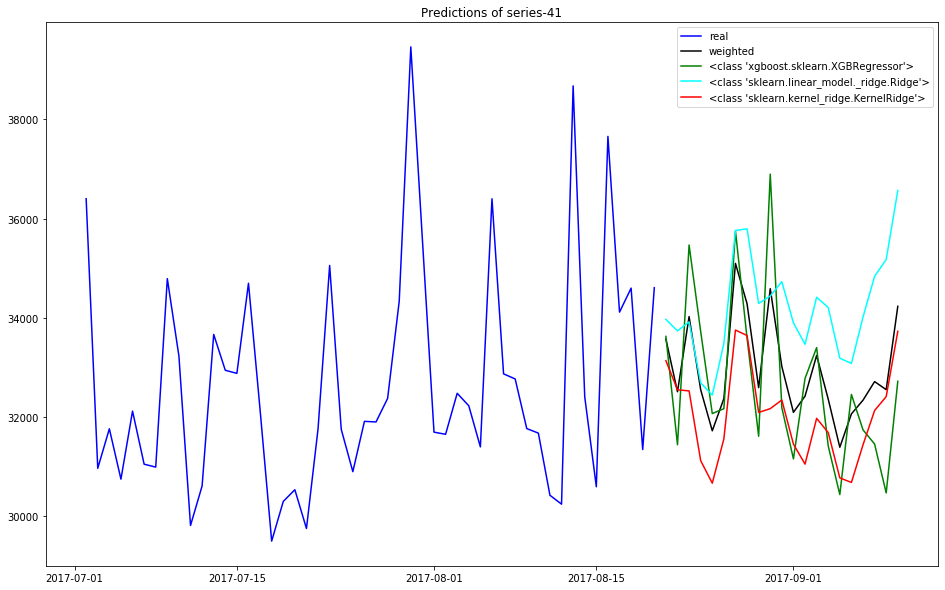

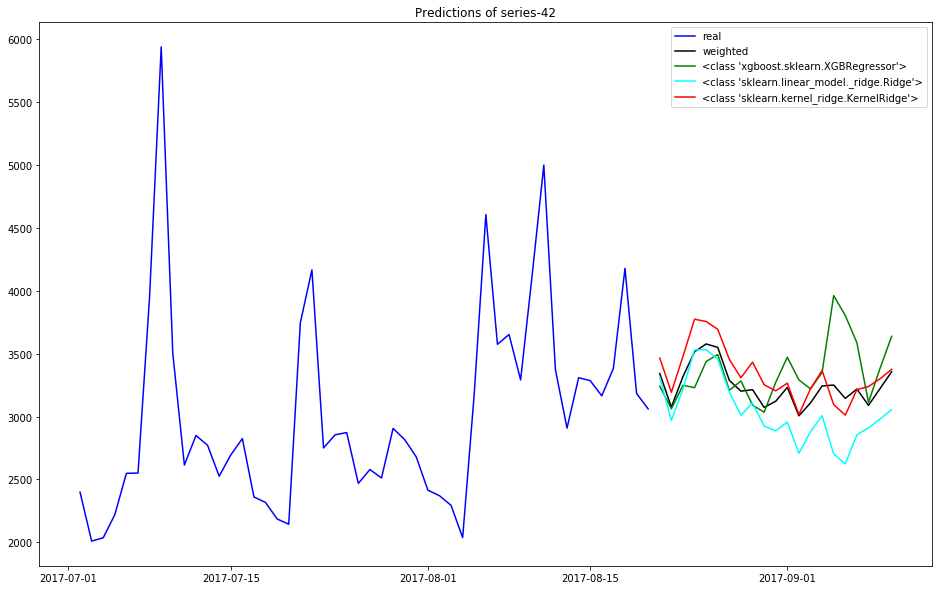

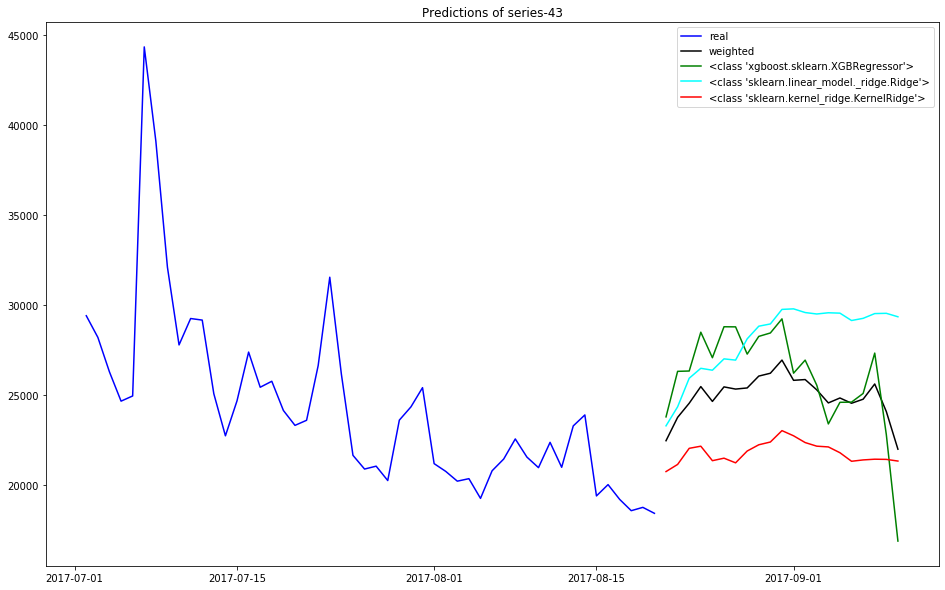

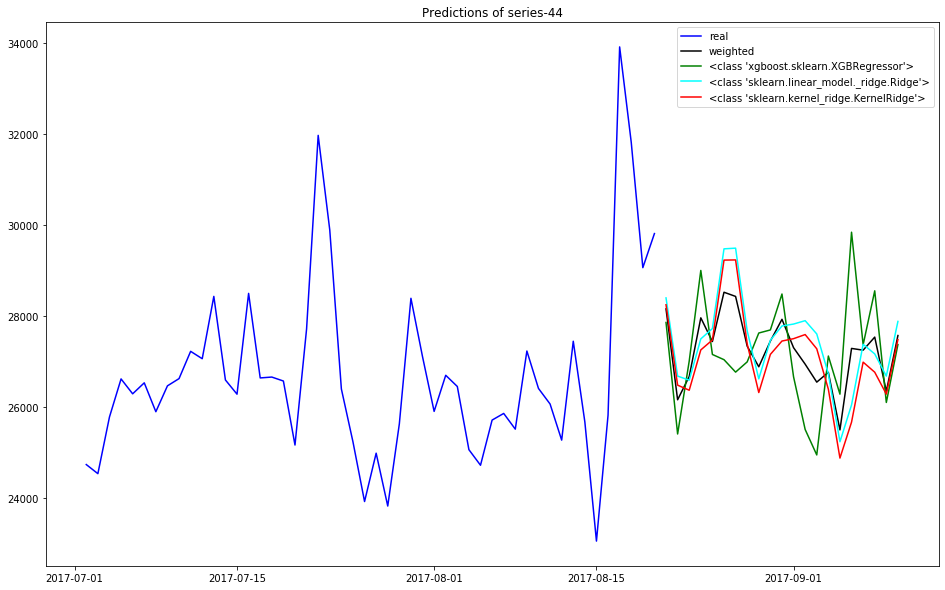

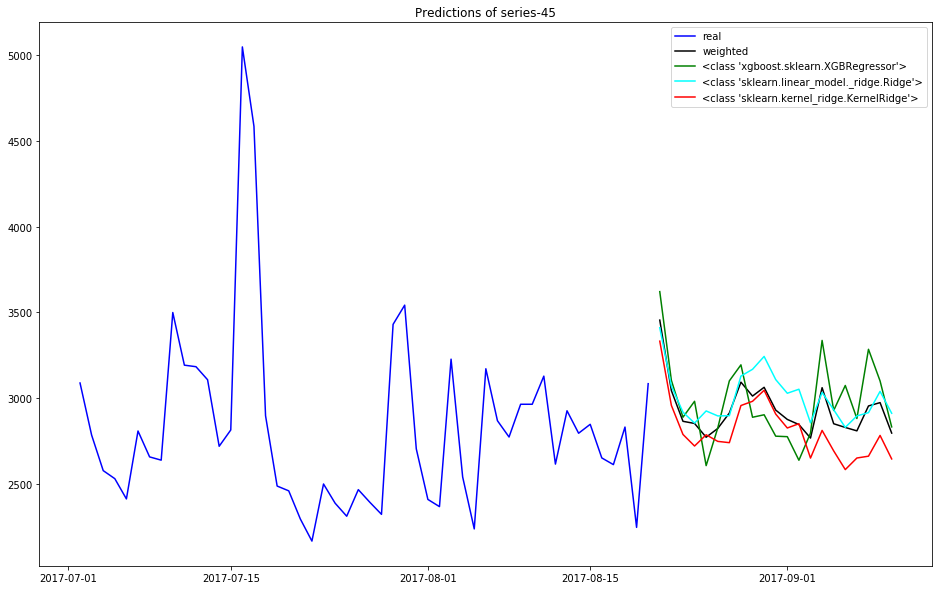

In [842]:
for column in future.columns:
    plt.figure(figsize=(16,10))
    plt.plot(df.tail(50)[column], color='blue')
    plt.plot(wp[column], color='black')
    # plt.plot(future_unscaled[column], color='red')
    for i in range(preds_futures_length):
        plt.plot(preds_futures[i][column], color=colors[(i+1)%preds_futures_length])
        
    legend = ['real', 'weighted']
    legend.extend([str(m) for m in models_constructors])
    plt.legend(legend)
    plt.title('Predictions of ' + str(column))
    
    plt.savefig('plot_pdf/predictions_of_'+(str(column))+'.pdf')
    
    plt.show()

In [805]:
# sub = keyvalue(wp)
# sub.to_csv("submission_reg_wp.csv", index=False)